# Data Exploration and Understanding: 

In [24]:
# Used to read, load, and manipulate the dataset
import numpy as np 
import pandas as pd 


import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from scipy.stats import mstats

import plotly.graph_objects as go
from plotly.subplots import make_subplots

import plotly.graph_objects as go
from plotly.subplots import make_subplots

import missingno as msno

import sweetviz as sv

# Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Models for Regression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Metrics to decide which ones are good models
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
%matplotlib inline

In [3]:
# Loading the dataset
df_orig = pd.read_csv('OnlineNewsPopularity.csv')
df = df_orig.copy()
df.head()

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


## The 'OnlineNewsPopularity.names' file provides detailed information about all 61 attributes in the dataset. Here's a complete list of these attributes:

1. **url**: URL of the article.
2. **timedelta**: Days between the article publication and the dataset acquisition.
3. **n_tokens_title**: Number of words in the title.
4. **n_tokens_content**: Number of words in the content.
5. **n_unique_tokens**: Rate of unique words in the content.
6. **n_non_stop_words**: Rate of non-stop words in the content.
7. **n_non_stop_unique_tokens**: Rate of unique non-stop words in the content.
8. **num_hrefs**: Number of links.
9. **num_self_hrefs**: Number of links to other articles published by Mashable.
10. **num_imgs**: Number of images.
11. **num_videos**: Number of videos.
12. **average_token_length**: Average length of the words in the content.
13. **num_keywords**: Number of keywords in the metadata.
14. **data_channel_is_lifestyle**: Is the article about lifestyle?
15. **data_channel_is_entertainment**: Is the article about entertainment?
16. **data_channel_is_bus**: Is the article about business?
17. **data_channel_is_socmed**: Is the article about social media?
18. **data_channel_is_tech**: Is the article about technology?
19. **data_channel_is_world**: Is the article about world news?
20. **kw_min_min**: Worst keyword (min. shares).
21. **kw_max_min**: Worst keyword (max. shares).
22. **kw_avg_min**: Worst keyword (avg. shares).
23. **kw_min_max**: Best keyword (min. shares).
24. **kw_max_max**: Best keyword (max. shares).
25. **kw_avg_max**: Best keyword (avg. shares).
26. **kw_min_avg**: Avg. keyword (min. shares).
27. **kw_max_avg**: Avg. keyword (max. shares).
28. **kw_avg_avg**: Avg. keyword (avg. shares).
29. **self_reference_min_shares**: Min. shares of referenced articles in Mashable.
30. **self_reference_max_shares**: Max. shares of referenced articles in Mashable.
31. **self_reference_avg_sharess**: Avg. shares of referenced articles in Mashable.
32. **weekday_is_monday**: Was the article published on a Monday?
33. **weekday_is_tuesday**: Was the article published on a Tuesday?
34. **weekday_is_wednesday**: Was the article published on a Wednesday?
35. **weekday_is_thursday**: Was the article published on a Thursday?
36. **weekday_is_friday**: Was the article published on a Friday?
37. **weekday_is_saturday**: Was the article published on a Saturday?
38. **weekday_is_sunday**: Was the article published on a Sunday?
39. **is_weekend**: Was the article published on the weekend?
40. **LDA_00**: Closeness to LDA topic 0.
41. **LDA_01**: Closeness to LDA topic 1.
42. **LDA_02**: Closeness to LDA topic 2.
43. **LDA_03**: Closeness to LDA topic 3.
44. **c**: Closeness to LDA topic 4.
45. **global_subjectivity**: Text subjectivity.
46. **global_sentiment_polarity**: Text sentiment polarity.
47. **global_rate_positive_words**: Rate of positive words in the content.
48. **global_rate_negative_words**: Rate of negative words in the content.
49. **rate_positive_words**: Rate of positive words among non-neutral tokens.
50. **rate_negative_words**: Rate of negative words among non-neutral tokens.
51. **avg_positive_polarity**: Avg. polarity of positive words.
52. **min_positive_polarity**: Min. polarity of positive words.
53. **max_positive_polarity**: Max. polarity of positive words.
54. **avg_negative_polarity**: Avg. polarity of negative words.
55. **min_negative_polarity**: Min. polarity of negative words.
56. **max_negative_polarity**: Max. polarity of negative words.
57. **title_subjectivity**: Title subjectivity.
58. **title_sentiment_polarity**: Title sentiment polarity.
59. **abs_title_subjectivity**: Absolute subjectivity level.
60. **abs_title_sentiment_polarity**: Absolute sentiment polarity level.
61. **shares**: Number of shares (target variable).

---
# Cleaning the Dataset
---

In [4]:
# Checking to see the datatypes and scope the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 61 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   url                             39644 non-null  object 
 1    timedelta                      39644 non-null  float64
 2    n_tokens_title                 39644 non-null  float64
 3    n_tokens_content               39644 non-null  float64
 4    n_unique_tokens                39644 non-null  float64
 5    n_non_stop_words               39644 non-null  float64
 6    n_non_stop_unique_tokens       39644 non-null  float64
 7    num_hrefs                      39644 non-null  float64
 8    num_self_hrefs                 39644 non-null  float64
 9    num_imgs                       39644 non-null  float64
 10   num_videos                     39644 non-null  float64
 11   average_token_length           39644 non-null  float64
 12   num_keywords                   

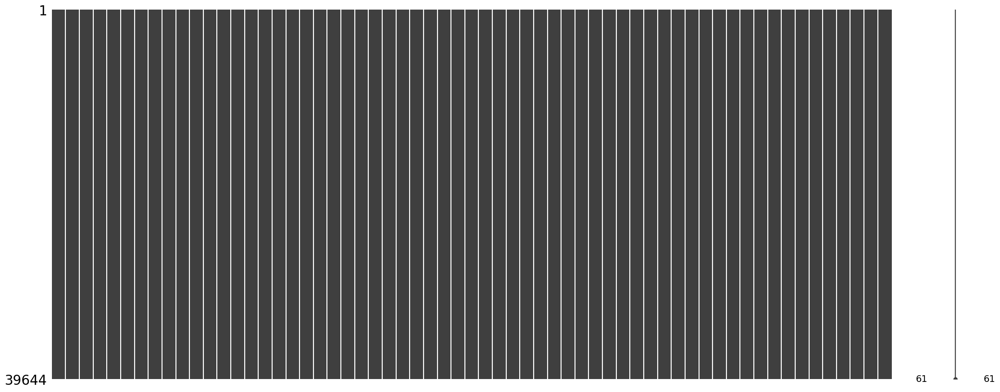

In [7]:
# Checking for duplicates 
df.duplicated(keep=False).sum() # No duplicates wherefound 

# Visualises for any features that have duplicated or missing data 
msno.matrix(df)
plt.show() # No Duplicated or missing data is found

In [10]:
# Cleaning the dataset
df.columns = df.columns.str.replace(' ', '') # Replaces the whitespace in each column 
df_clean = df.drop(['url', 'LDA_00', 'LDA_01', 'LDA_02','LDA_03','LDA_04'], axis = 1) # removes unecessary columns 
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 55 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   timedelta                      39644 non-null  float64
 1   n_tokens_title                 39644 non-null  float64
 2   n_tokens_content               39644 non-null  float64
 3   n_unique_tokens                39644 non-null  float64
 4   n_non_stop_words               39644 non-null  float64
 5   n_non_stop_unique_tokens       39644 non-null  float64
 6   num_hrefs                      39644 non-null  float64
 7   num_self_hrefs                 39644 non-null  float64
 8   num_imgs                       39644 non-null  float64
 9   num_videos                     39644 non-null  float64
 10  average_token_length           39644 non-null  float64
 11  num_keywords                   39644 non-null  float64
 12  data_channel_is_lifestyle      39644 non-null 

### Insights:
    - Scanning the dataset, it can be observed that no detected missing data and duplicates are found. A whitespace is found in the beginning of each feature; this are corrected using a string replace code. 

# Descriptive Statistics 

In [12]:
# Checks the shape of the dataset
print("The dimensions of the ONLINE NEWS POPULARITY dataset, in terms of rows and columns respectively", 
      df_clean.shape[0],'rows and',df_clean.shape[1],'columns.')

The dimensions of the ONLINE NEWS POPULARITY dataset, in terms of rows and columns respectively 39644 rows and 55 columns.


In [13]:
# Outputs the descriptive statistics of the dataset 
df_clean.describe()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,...,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,354.530471,10.398749,546.514731,0.548216,0.996469,0.689175,10.883690,3.293638,4.544143,1.249874,...,0.095446,0.756728,-0.259524,-0.521944,-0.107500,0.282353,0.071425,0.341843,0.156064,3395.380184
std,214.163767,2.114037,471.107508,3.520708,5.231231,3.264816,11.332017,3.855141,8.309434,4.107855,...,0.071315,0.247786,0.127726,0.290290,0.095373,0.324247,0.265450,0.188791,0.226294,11626.950749
min,8.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,1.000000
25%,164.000000,9.000000,246.000000,0.470870,1.000000,0.625739,4.000000,1.000000,1.000000,0.000000,...,0.050000,0.600000,-0.328383,-0.700000,-0.125000,0.000000,0.000000,0.166667,0.000000,946.000000
50%,339.000000,10.000000,409.000000,0.539226,1.000000,0.690476,8.000000,3.000000,1.000000,0.000000,...,0.100000,0.800000,-0.253333,-0.500000,-0.100000,0.150000,0.000000,0.500000,0.000000,1400.000000
75%,542.000000,12.000000,716.000000,0.608696,1.000000,0.754630,14.000000,4.000000,4.000000,1.000000,...,0.100000,1.000000,-0.186905,-0.300000,-0.050000,0.500000,0.150000,0.500000,0.250000,2800.000000
max,731.000000,23.000000,8474.000000,701.000000,1042.000000,650.000000,304.000000,116.000000,128.000000,91.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.500000,1.000000,843300.000000


In [15]:
# Outputs the descriptive statistics of the dataset, including categorical values
df.describe(include='O')

,url
count,39644
unique,39644
top,http://mashable.com/2013/01/07/amazon-instant-...
freq,1


---
# Auto-EDA (SweetViz
)
---

In [9]:
# df_report = sv.analyze(df)
# df_report.show_html()

---
# EDA
---

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 61 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   url                             39644 non-null  object 
 1    timedelta                      39644 non-null  float64
 2    n_tokens_title                 39644 non-null  float64
 3    n_tokens_content               39644 non-null  float64
 4    n_unique_tokens                39644 non-null  float64
 5    n_non_stop_words               39644 non-null  float64
 6    n_non_stop_unique_tokens       39644 non-null  float64
 7    num_hrefs                      39644 non-null  float64
 8    num_self_hrefs                 39644 non-null  float64
 9    num_imgs                       39644 non-null  float64
 10   num_videos                     39644 non-null  float64
 11   average_token_length           39644 non-null  float64
 12   num_keywords                   

In [12]:
df_clean.head()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,0.0,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


In [17]:
def pair_plot(datadf, y, *x):
    '''
    This will return a generated pairplot with a one is to many relationship  
    
    Parameters:
    -----------
    datadf: dataset - the input dataset to plot
    y: column - chosen column from the dataset
    x: column - chosen column/s from the dataset

    Return:
    -----------
    Returns a generated pairplot 
    '''
    sns.pairplot(data=datadf,
                  y_vars=y,
                  x_vars=x,
            hue = y
            )

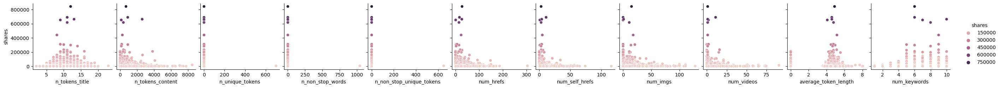

In [18]:
pair_plot(df_clean, 'shares', 'n_tokens_title', 'n_tokens_content', 'n_unique_tokens', 'n_non_stop_words', 
                          'n_non_stop_unique_tokens', 'num_hrefs', 'num_self_hrefs', 'num_imgs', 
                          'num_videos', 'average_token_length', 'num_keywords')

In [19]:
# Creating a subset for visualising the topics of the dataset
channel_df = df_clean[['data_channel_is_lifestyle',
                      'data_channel_is_entertainment',
                      'data_channel_is_bus',
                      'data_channel_is_socmed',
                      'data_channel_is_tech',
                      'data_channel_is_world', 'shares']]

# Renames the columns 
channel_df.columns = ['Lifestyle',
                      'Entertainment',
                      'Bus',
                      'Social Media',
                      'Technology',
                      'World',
                      'Shares',
                      ]
channel_df

,Lifestyle,Entertainment,Bus,Social Media,Technology,World,Shares
0,0.0,1.0,0.0,0.0,0.0,0.0,593
1,0.0,0.0,1.0,0.0,0.0,0.0,711
2,0.0,0.0,1.0,0.0,0.0,0.0,1500
3,0.0,1.0,0.0,0.0,0.0,0.0,1200
4,0.0,0.0,0.0,0.0,1.0,0.0,505
...,...,...,...,...,...,...,...
39639,0.0,0.0,0.0,0.0,1.0,0.0,1800
39640,0.0,0.0,0.0,1.0,0.0,0.0,1900
39641,0.0,0.0,0.0,0.0,0.0,0.0,1900
39642,0.0,0.0,0.0,0.0,0.0,1.0,1100


In [21]:
# Creates a base table to create the dataset
subset_channels = pd.DataFrame(columns = ['Binary'])
subset_channels['Binary'] = ['No', 'Yes']

# Creates columms with the group by function; returns the sum total of the number of online news that has that aprticular topic
subset_channels['Lifestyle'] = channel_df.groupby(['Lifestyle'])['Shares'].sum().reset_index().drop('Lifestyle', axis = 1)
subset_channels['Entertainment'] = channel_df.groupby(['Entertainment'])['Shares'].sum().reset_index().drop('Entertainment', axis = 1)
subset_channels['Bus'] = channel_df.groupby(['Bus'])['Shares'].sum().reset_index().drop('Bus', axis = 1)
subset_channels['Social Media'] = channel_df.groupby(['Social Media'])['Shares'].sum().reset_index().drop('Social Media', axis = 1)
subset_channels['Technology'] = channel_df.groupby(['Technology'])['Shares'].sum().reset_index().drop('Technology', axis = 1)
subset_channels['World'] = channel_df.groupby(['World'])['Shares'].sum().reset_index().drop('World', axis = 1)

subset_channels

,Binary,Lifestyle,Entertainment,Bus,Social Media,Technology,World
0,No,126877675,113643725,115438082,126175395,112037459,115327717
1,Yes,7728777,20962727,19168370,8431057,22568993,19278735


In [22]:
# Reorganises the subset by using .melt
melted_channels  = subset_channels.melt(var_name="Channel", value_name="Shares")
melted_channels = melted_channels.drop([0,1]).reset_index().drop('index', axis = 1 )

# Changes the Shares column to int 
melted_channels['Shares'] = melted_channels['Shares'].astype(int)
melted_channels.info()
melted_channels

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Channel  12 non-null     object
 1   Shares   12 non-null     int32 
dtypes: int32(1), object(1)
memory usage: 276.0+ bytes


,Channel,Shares
0,Lifestyle,126877675
1,Lifestyle,7728777
2,Entertainment,113643725
3,Entertainment,20962727
4,Bus,115438082
5,Bus,19168370
6,Social Media,126175395
7,Social Media,8431057
8,Technology,112037459
9,Technology,22568993


In [23]:
# Separates the subsets that have that specific topic 
yes_melted_channels = melted_channels.iloc[1::2, : ].sort_values(by=['Shares'], ascending=False) 
no_melted_channels = melted_channels.iloc[::2, : ].sort_values(by=['Shares'], ascending=False)

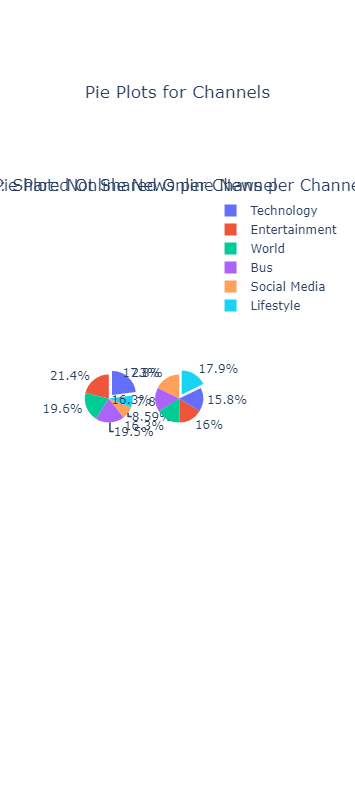

In [20]:
# Create Subplots using plotly 
specs = [[{'type':'domain'}, {'type':'domain'}]]

# Creating the subplots
fig = make_subplots(rows=1, cols=2, specs=specs, 
                    subplot_titles = (
                        "Pie Plot: Shared Online News per Channel", 
                        'Pie Plot: Non Shared Online News per Channel', 'Testing2', 'testing' 
                    ))

# Pieplot: Shared Online News per Channel 
fig.add_trace(go.Pie(labels=yes_melted_channels['Channel'],
    values=yes_melted_channels['Shares'], name="Shared", pull=[0.2, 0, 0, 0, 0, 0]),
              row = 1, col = 1)

# Pieplot: Non - Shared Online News per Channel 
fig.add_trace(go.Pie(labels=no_melted_channels['Channel'],
    values=no_melted_channels['Shares'], name="Not Shared", pull=[0.2, 0, 0, 0, 0, 0]),
              row = 1, col = 2)

fig.update_layout(height=800, width=1000, title_text='Pie Plots for Channels',
                  title_x=0.5, showlegend=True)

In [26]:
def get_chan(row):
    '''
    This will create a new data row containing the topic of the online news article
    
    Parameters:
    -----------
    row: column - column to put the data 

    Return:
    -----------
    Returns a new column
    '''  
    for chan in channel_df.columns:
        if row[chan]==1.0:
            return chan

# Creates a Channel Column applying the get_chan function
channel_df['Channel'] = channel_df.apply(get_chan, axis=1)

# Fixes the column
channel_df = channel_df[channel_df['Channel'].notna()].reset_index().drop(['index'], axis = 1)
channel_df

,Lifestyle,Entertainment,Bus,Social Media,Technology,World,Shares,Channel
0,0.0,1.0,0.0,0.0,0.0,0.0,593,Entertainment
1,0.0,0.0,1.0,0.0,0.0,0.0,711,Bus
2,0.0,0.0,1.0,0.0,0.0,0.0,1500,Bus
3,0.0,1.0,0.0,0.0,0.0,0.0,1200,Entertainment
4,0.0,0.0,0.0,0.0,1.0,0.0,505,Technology
...,...,...,...,...,...,...,...,...
33505,0.0,0.0,1.0,0.0,0.0,0.0,1200,Bus
33506,0.0,0.0,0.0,0.0,1.0,0.0,1800,Technology
33507,0.0,0.0,0.0,1.0,0.0,0.0,1900,Social Media
33508,0.0,0.0,0.0,0.0,0.0,1.0,1100,World


In [27]:
# Applies IQR to the dataset based on the Shares column to remove outliers. 
Q1 = channel_df['Shares'].quantile(0.25)
Q3 = channel_df['Shares'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

# Create arrays of Boolean values indicating the outlier rows
upper_array = np.where(channel_df['Shares'] >= upper)[0]
lower_array = np.where(channel_df['Shares'] <= lower)[0]

In [28]:
# Removing the outliers
channel_df.drop(index=upper_array, inplace=True)
channel_df.drop(index=lower_array, inplace=True)

channel_df.shape

(29705, 8)

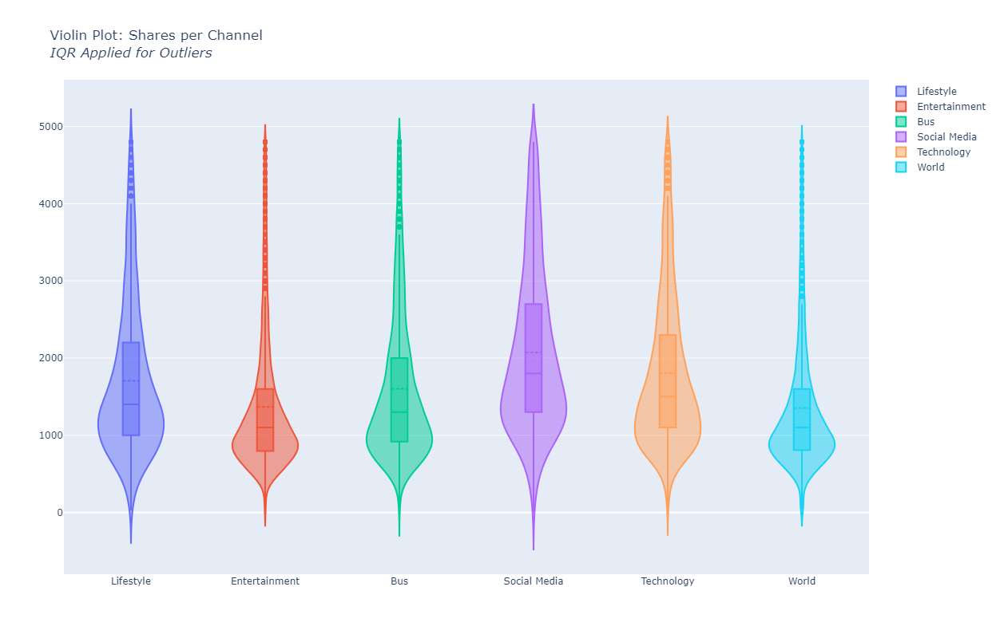

In [29]:
# Generates a Violin Plot
fig = go.Figure()

# List of channels 
chans = ['Lifestyle', 'Entertainment', 'Bus', 'Social Media','Technology', 'World']

# Generates the violin plots for each channel
for chan in chans:
    fig.add_trace(go.Violin(x=channel_df['Channel'][channel_df['Channel'] == chan],
                            y=channel_df['Shares'][channel_df['Channel'] == chan],
                            name=chan,
                            box_visible=True,
                            meanline_visible=True))
             
fig.update_traces(meanline_visible=True,
                  scalemode='count') #scale violin plot area with total count
fig.update_layout(height=800, width=1000,
    title_text="Violin Plot: Shares per Channel<br><i>IQR Applied for Outliers"
                 )

In [26]:
weekday_df = df_clean[['weekday_is_monday',
                      'weekday_is_tuesday',
                      'weekday_is_wednesday',
                      'weekday_is_thursday',
                      'weekday_is_friday',
                      'weekday_is_saturday',
                       'weekday_is_sunday',
                       'shares']]

weekday_df.columns = ['Monday',
                      'Tuesday',
                      'Wednesday',
                      'Thursday',
                      'Friday',
                      'Saturday',
                      'Sunday',
                      'Shares',
                      ]
weekday_df

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,Shares
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,593
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,711
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1500
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1200
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,505
...,...,...,...,...,...,...,...,...
39639,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1800
39640,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1900
39641,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1900
39642,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1100


In [27]:
subset_weekday = pd.DataFrame(columns = ['Binary'])
subset_weekday['Binary'] = ['No', 'Yes']
subset_weekday['Monday'] = weekday_df.groupby(['Monday'])['Shares'].sum().reset_index().drop('Monday', axis = 1)
subset_weekday['Tuesday'] = weekday_df.groupby(['Tuesday'])['Shares'].sum().reset_index().drop('Tuesday', axis = 1)
subset_weekday['Wednesday'] = weekday_df.groupby(['Wednesday'])['Shares'].sum().reset_index().drop('Wednesday', axis = 1)
subset_weekday['Thursday'] = weekday_df.groupby(['Thursday'])['Shares'].sum().reset_index().drop('Thursday', axis = 1)
subset_weekday['Friday'] = weekday_df.groupby(['Friday'])['Shares'].sum().reset_index().drop('Friday', axis = 1)
subset_weekday['Saturday'] = weekday_df.groupby(['Saturday'])['Shares'].sum().reset_index().drop('Saturday', axis = 1)
subset_weekday

,Binary,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday
0,No,110313613,110939972,110045633,111507572,115877635,124602664
1,Yes,24292839,23666480,24560819,23098880,18728817,10003788


In [28]:
melted_weekday  = subset_weekday.melt(var_name="Day", value_name="Shares")
melted_weekday = melted_weekday.drop([0,1]).reset_index().drop('index', axis = 1 )
# melted_channels = melted_channels['Shares'].astype(int)
melted_weekday['Shares'] = melted_weekday['Shares'].astype(int)
melted_weekday.info()
melted_weekday

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Day     12 non-null     object
 1   Shares  12 non-null     int32 
dtypes: int32(1), object(1)
memory usage: 276.0+ bytes


,Day,Shares
0,Monday,110313613
1,Monday,24292839
2,Tuesday,110939972
3,Tuesday,23666480
4,Wednesday,110045633
5,Wednesday,24560819
6,Thursday,111507572
7,Thursday,23098880
8,Friday,115877635
9,Friday,18728817


In [29]:
yes_melted_weekday = melted_weekday.iloc[1::2, : ].sort_values(by=['Shares'], ascending=False)
no_melted_weekday = melted_weekday.iloc[::2, : ].sort_values(by=['Shares'], ascending=False)

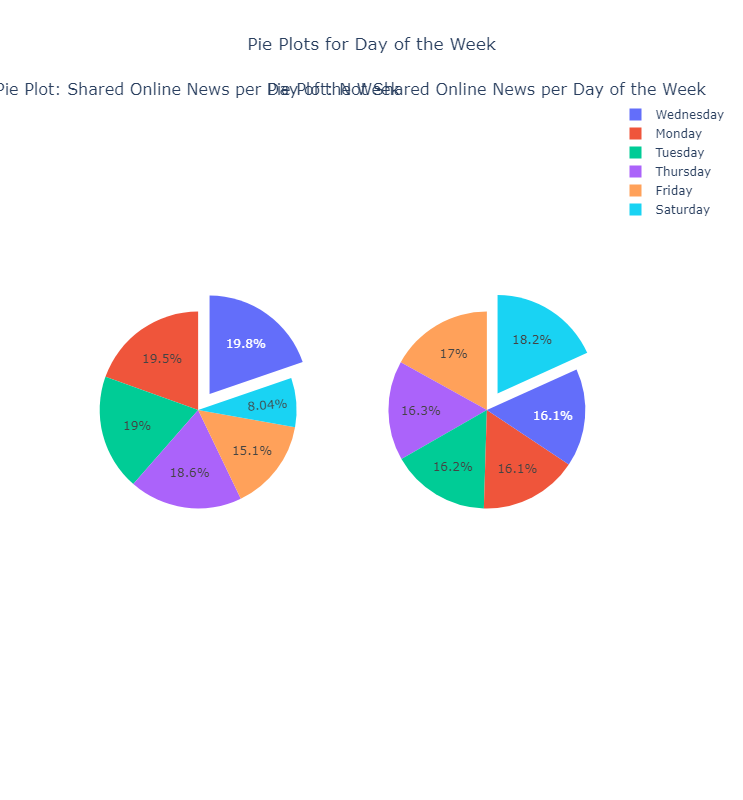

In [30]:
specs = [[{'type':'domain'}, {'type':'domain'}]]

fig = make_subplots(rows=1, cols=2, specs=specs, 
                    subplot_titles = (
                        "Pie Plot: Shared Online News per Day of the Week", 
                        'Pie Plot: Not Shared Online News per Day of the Week'
                    ))


fig.add_trace(go.Pie(labels=yes_melted_weekday['Day'],
    values=yes_melted_weekday['Shares'], name="Shared", pull=[0.2, 0, 0, 0, 0, 0]),
              row = 1, col = 1)

fig.add_trace(go.Pie(labels=no_melted_weekday['Day'],
    values=no_melted_weekday['Shares'], name="Not Shared", pull=[0.2, 0, 0, 0, 0, 0]),
              row = 1, col = 2)

fig.update_layout(height=800, width=1100, title_text='Pie Plots for Day of the Week',
                  title_x=0.5, showlegend=True)

In [31]:
weekday_df

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,Shares
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,593
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,711
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1500
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1200
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,505
...,...,...,...,...,...,...,...,...
39639,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1800
39640,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1900
39641,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1900
39642,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1100


In [32]:
def get_day(row):
    for day  in weekday_df.columns:
        if row[day]==1:
            return day
        
weekday_df['Day'] = weekday_df.apply(get_day, axis=1)
weekday_df

C:\Users\zacha\AppData\Local\Temp\ipykernel_15276\3857164085.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,Shares,Day
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,593,Monday
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,711,Monday
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1500,Monday
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1200,Monday
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,505,Monday
...,...,...,...,...,...,...,...,...,...
39639,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1800,Wednesday
39640,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1900,Wednesday
39641,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1900,Wednesday
39642,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1100,Wednesday


In [33]:
Q1 = weekday_df['Shares'].quantile(0.25)
Q3 = weekday_df['Shares'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR
 
# Create arrays of Boolean values indicating the outlier rows
upper_array = np.where(weekday_df['Shares'] >= upper)[0]
lower_array = np.where(weekday_df['Shares'] <= lower)[0]
 
# Removing the outliers
weekday_df.drop(index=upper_array, inplace=True)
weekday_df.drop(index=lower_array, inplace=True)

weekday_df.shape

C:\Users\zacha\AppData\Local\Temp\ipykernel_15276\3883104594.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\zacha\AppData\Local\Temp\ipykernel_15276\3883104594.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(35103, 9)

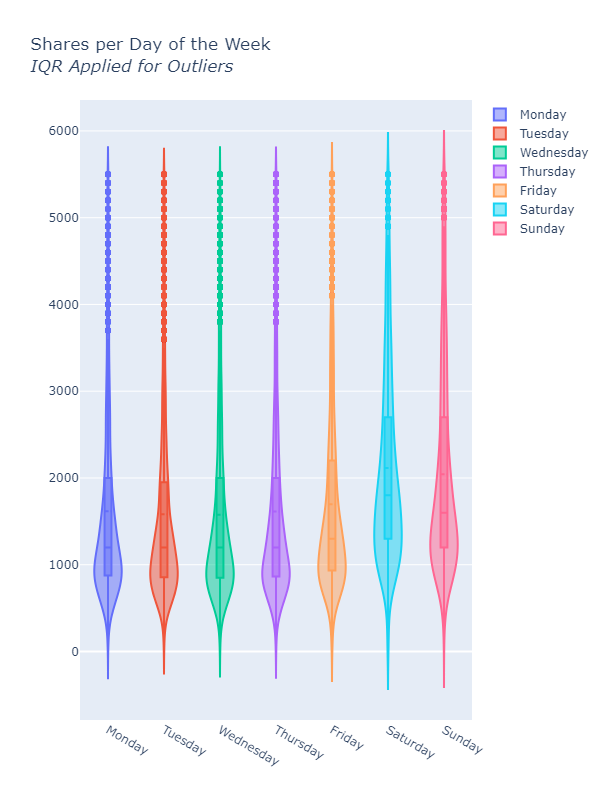

In [34]:
fig = go.Figure()

days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday', 'Saturday', 'Sunday']

for day in days:
    fig.add_trace(go.Violin(x=weekday_df['Day'][weekday_df['Day'] == day],
                            y=weekday_df['Shares'][weekday_df['Day'] == day],
                            name=day,
                            box_visible=True,
                            meanline_visible=True))
             
fig.update_traces(meanline_visible=True,
                  scalemode='count') #scale violin plot area with total count
fig.update_layout(height=800, width=1000,
    title_text="Shares per Day of the Week<br><i>IQR Applied for Outliers"
                 )

---
# Data Preprocessing 
---

## Data Preprocessing

General Process for Data Processing: (Need to explain each process and why its relevant to the dataset)
- Data Cleaning
- Feature Selection
- Data Transformation
- Categorical Encoding 
- Splitting the Data

In [35]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 55 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   timedelta                      39644 non-null  float64
 1   n_tokens_title                 39644 non-null  float64
 2   n_tokens_content               39644 non-null  float64
 3   n_unique_tokens                39644 non-null  float64
 4   n_non_stop_words               39644 non-null  float64
 5   n_non_stop_unique_tokens       39644 non-null  float64
 6   num_hrefs                      39644 non-null  float64
 7   num_self_hrefs                 39644 non-null  float64
 8   num_imgs                       39644 non-null  float64
 9   num_videos                     39644 non-null  float64
 10  average_token_length           39644 non-null  float64
 11  num_keywords                   39644 non-null  float64
 12  data_channel_is_lifestyle      39644 non-null 

In [36]:
# df_clean = df.drop(['url', 'LDA_00', 'LDA_01', 'LDA_02','LDA_03','LDA_04', 
#                     'timedelta','n_tokens_title','n_tokens_content','n_unique_tokens',
#                     'n_non_stop_words','num_self_hrefs',
#                     'num_hrefs','num_imgs',
#                     'num_videos','average_token_length',
#                     'num_keywords'
#                    ], axis = 1)
# df_clean

In [37]:
df_clean = df.drop(['url', 'LDA_00', 'LDA_01', 'LDA_02','LDA_03','LDA_04', 
                    'timedelta'
                   ], axis = 1)
df_clean

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,4.680365,...,0.100000,0.70,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,4.913725,...,0.033333,0.70,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,4.393365,...,0.100000,1.00,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,4.404896,...,0.136364,0.80,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,0.0,4.682836,...,0.033333,1.00,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39639,11.0,346.0,0.529052,1.0,0.684783,9.0,7.0,1.0,1.0,4.523121,...,0.100000,0.75,-0.260000,-0.500,-0.125000,0.100000,0.000000,0.400000,0.000000,1800
39640,12.0,328.0,0.696296,1.0,0.885057,9.0,7.0,3.0,48.0,4.405488,...,0.136364,0.70,-0.211111,-0.400,-0.100000,0.300000,1.000000,0.200000,1.000000,1900
39641,10.0,442.0,0.516355,1.0,0.644128,24.0,1.0,12.0,1.0,5.076923,...,0.136364,0.50,-0.356439,-0.800,-0.166667,0.454545,0.136364,0.045455,0.136364,1900
39642,6.0,682.0,0.539493,1.0,0.692661,10.0,1.0,1.0,0.0,4.975073,...,0.062500,0.50,-0.205246,-0.500,-0.012500,0.000000,0.000000,0.500000,0.000000,1100


In [38]:
# # ONLY RUN COMMAND TO CHECK IF THERE ARE OUTLIERS
# fig = go.Figure()
# for col in df_testing.columns:
#     fig.add_trace(go.Box(y=df_testing[col], name=col))

# fig.update_layout(height=800, width=1100, title_text='Bar Plots for Columns in Dataframe',
#                   title_x=0.5, showlegend=True)
# fig.show()

In [39]:
Q1 = df_clean['shares'].quantile(0.25)
Q3 = df_clean['shares'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR
 
# Create arrays of Boolean values indicating the outlier rows
upper_array = np.where(df_clean['shares'] >= upper)[0]
lower_array = np.where(df_clean['shares'] <= lower)[0]
 
# Removing the outliers
df_clean.drop(index=upper_array, inplace=True)
df_clean.drop(index=lower_array, inplace=True)

df_clean.shape

(35103, 54)

In [40]:
# Feature Selection - remove what is not needed for machine learning 
features = df_clean.drop(['shares'], axis = 1) 
target = df_clean['shares']  

In [41]:
# Data Transformation: Standardisation - scale the data 
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features) # scales the selected features

In [42]:
# Splitting the data: Will be using 80-20 as it is standard 
X_train, X_test, y_train, y_test = train_test_split(features_scaled, 
                                                    target, test_size=0.2, random_state=19)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((28082, 53), (7021, 53), (28082,), (7021,))

--- 
# Deploying the Model 
---

In [43]:
#Instantiate the Model
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Predictions using the Linear Regression model
y_pred_linear_reg = linear_model.predict(X_test)

In [44]:
#Coefficient
coefficients = linear_model.coef_

#DataFrame
feature_names = features.columns
coefficients_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Sorting the coefficients to find the top 10 factors
top_10_factors = coefficients_df.reindex(coefficients_df.Coefficient.abs().sort_values(ascending=False).index).head(10)
top_10_factors

,Feature,Coefficient
36,is_weekend,-8.340072e+13
35,weekday_is_sunday,8.263543e+13
34,weekday_is_saturday,7.885921e+13
31,weekday_is_wednesday,3.166353e+13
30,weekday_is_tuesday,3.155144e+13
32,weekday_is_thursday,3.141221e+13
29,weekday_is_monday,3.016396e+13
33,weekday_is_friday,2.843983e+13
25,kw_avg_avg,4.110376e+02
24,kw_max_avg,-2.484242e+02


In [45]:
from sklearn.metrics import mean_squared_error, r2_score

# Assuming random_forest and the dataset (X_train, X_test, y_train, y_test) are already defined

# Predictions
y_train_pred = linear_model.predict(X_train)
y_val_pred = linear_model.predict(X_test)

# Evaluating the model
train_mse = mean_squared_error(y_train, y_train_pred)
val_mse = mean_squared_error(y_test, y_val_pred)
train_r2 = r2_score(y_train, y_train_pred)
val_r2 = r2_score(y_test, y_val_pred)

print(f"Training MSE: {train_mse}, Validation MSE: {val_mse}")
print(f"Training R^2: {train_r2}, Validation R^2: {val_r2}")

# Thresholds for performance difference
mse_threshold = 0.1 * train_mse  # 10% of training MSE
r2_threshold = 0.05  # 5% difference in R^2

# Determine fit with threshold consideration
if (val_mse > train_mse + mse_threshold) or (val_r2 < train_r2 - r2_threshold):
    print("The model might be overfitting.")
elif (train_mse > val_mse + mse_threshold) or (train_r2 + r2_threshold < val_r2):
    print("The model might be underfitting.")
else:
    print("The model seems well-balanced.")

Training MSE: 1088662.191158228, Validation MSE: 1082773.4047131455
Training R^2: 0.11056949634300595, Validation R^2: 0.0893021322733385
The model seems well-balanced.


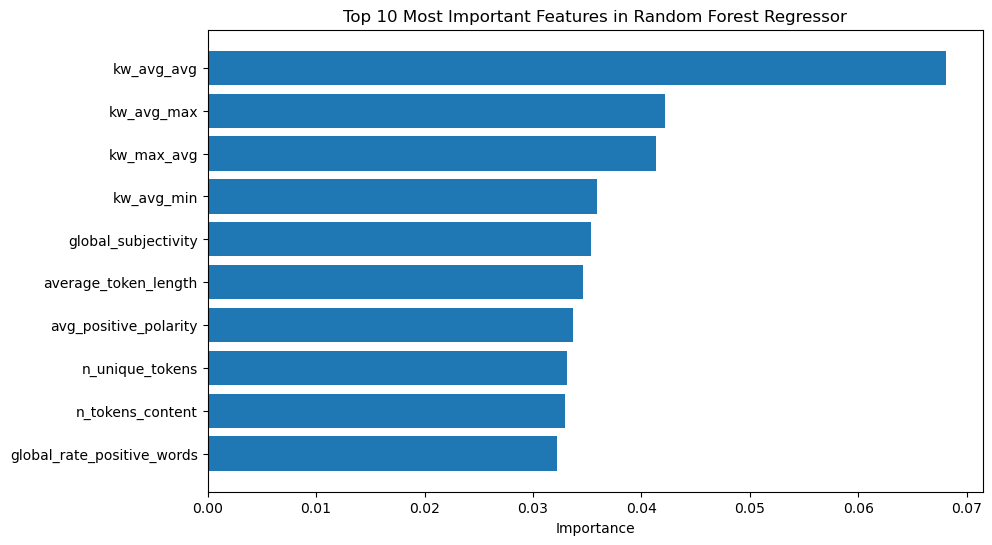

,Feature,Importance
25,kw_avg_avg,0.068055
22,kw_avg_max,0.042201
24,kw_max_avg,0.041312
19,kw_avg_min,0.035873
37,global_subjectivity,0.035324
9,average_token_length,0.034614
43,avg_positive_polarity,0.033687
2,n_unique_tokens,0.033159
1,n_tokens_content,0.032996
39,global_rate_positive_words,0.032197


In [46]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt


# Running a Random Forest Regressor
random_forest = RandomForestRegressor(n_estimators=100, random_state=42)
random_forest.fit(X_train, y_train)

# Getting the feature importances
feature_importances = random_forest.feature_importances_

# Creating a DataFrame for feature names and their importances
feature_importances_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

# Sorting the feature importances to find the top 10
top_10_important_features = feature_importances_df.reindex(
    feature_importances_df.Importance.sort_values(ascending=False).index
).head(10)

# Plotting the top 10 most important features
plt.figure(figsize=(10, 6))
plt.title('Top 10 Most Important Features in Random Forest Regressor')
plt.barh(top_10_important_features['Feature'], top_10_important_features['Importance'])
plt.xlabel('Importance')
plt.gca().invert_yaxis() # To display the highest importance at the top
plt.show()
b
top_10_important_features

In [56]:
from sklearn.metrics import mean_squared_error, r2_score

# Assuming random_forest and the dataset (X_train, X_test, y_train, y_test) are already defined

# Predictions
y_train_pred = random_forest.predict(X_train)
y_val_pred = random_forest.predict(X_test)

# Evaluating the model
train_mse = mean_squared_error(y_train, y_train_pred)
val_mse = mean_squared_error(y_test, y_val_pred)
train_r2 = r2_score(y_train, y_train_pred)
val_r2 = r2_score(y_test, y_val_pred)

print(f"Training MSE: {train_mse}, Validation MSE: {val_mse}")
print(f"Training R^2: {train_r2}, Validation R^2: {val_r2}")

# Thresholds for performance difference
mse_threshold = 0.1 * train_mse  # 10% of training MSE
r2_threshold = 0.05  # 5% difference in R^2

# Determine fit with threshold consideration
if (val_mse > train_mse + mse_threshold) or (val_r2 < train_r2 - r2_threshold):
    print("The model might be overfitting.")
elif (train_mse > val_mse + mse_threshold) or (train_r2 + r2_threshold < val_r2):
    print("The model might be underfitting.")
else:
    print("The model seems well-balanced.")


Training MSE: 152321.48646265222, Validation MSE: 1077986.6990498505
Training R^2: 0.8755542559275231, Validation R^2: 0.0933281294229017
The model might be overfitting.


In [71]:
df_clean.columns[-1]

'shares'

In [72]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

#preview
features = features.columns
target = df_clean.columns[-1]

#X and y values
X = df_clean[features].values
y = df_clean[target].values

#splot
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=17)

print("The dimension of X_train is {}".format(X_train.shape))
print("The dimension of X_test is {}".format(X_test.shape))
#Scale features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

ridge = Ridge(alpha=10)
ridge.fit(X_train, y_train)

The dimension of X_train is (24572, 53)
The dimension of X_test is (10531, 53)


Ridge(alpha=10)

In [62]:
X_pred_ridge_test = ridge.predict(X_test)
r2_score(y_test, X_pred_ridge_test)

0.08933625230476872

In [78]:
#Model
lr = LinearRegression()

#Fit model
lr.fit(X_train, y_train)

#predict
#prediction = lr.predict(X_test)

#actual
actual = y_test

train_score_lr = lr.score(X_train, y_train)
test_score_lr = lr.score(X_test, y_test)

print("The train score for lr model is {}".format(train_score_lr))
print("The test score for lr model is {}".format(test_score_lr))


#Ridge Regression Model
ridgeReg = Ridge(alpha=10)

ridgeReg.fit(X_train,y_train)

#train and test scorefor ridge regression
train_score_ridge = ridgeReg.score(X_train, y_train)
test_score_ridge = ridgeReg.score(X_test, y_test)

print("\nRidge Model............................................\n")
print("The train score for ridge model is {}".format(train_score_ridge))
print("The test score for ridge model is {}".format(test_score_ridge))

The train score for lr model is 0.10461940339339149
The test score for lr model is 0.10968269443838685

Ridge Model............................................

The train score for ridge model is 0.10461813721260727
The test score for ridge model is 0.10969921231197155


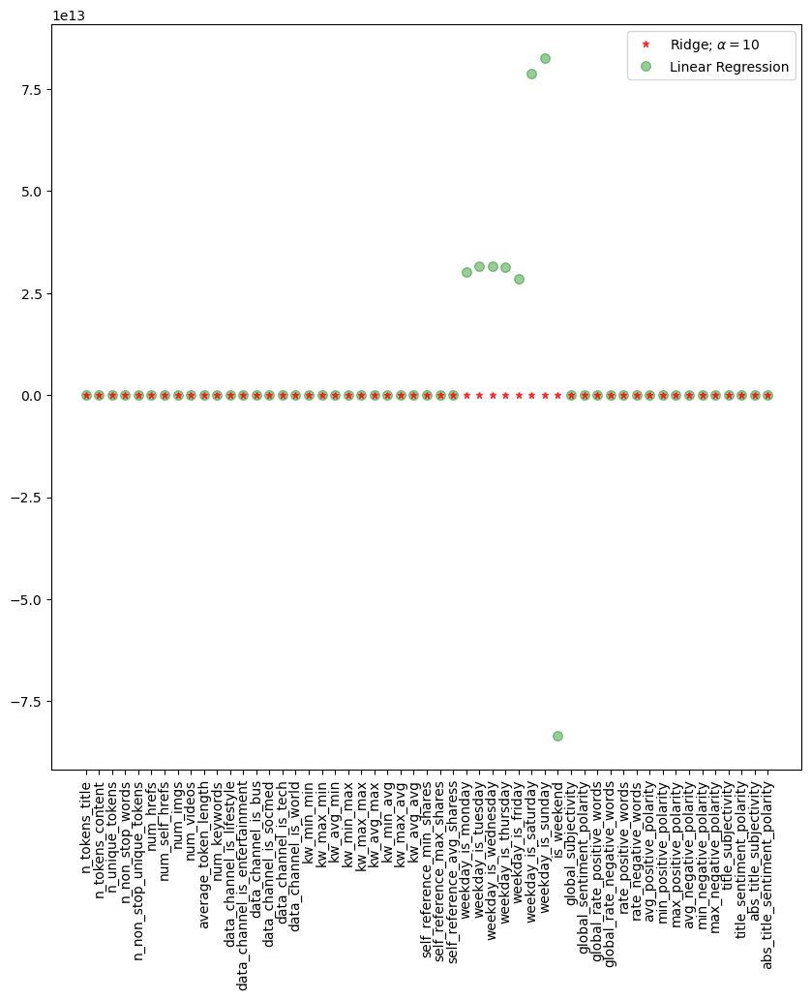

In [79]:
plt.figure(figsize = (10, 10))
plt.plot(features,ridge.coef_,alpha=0.7,linestyle='none',marker='*',markersize=5,color='red',label=r'Ridge; $\alpha = 10$',zorder=7)
#plt.plot(rr100.coef_,alpha=0.5,linestyle='none',marker='d',markersize=6,color='blue',label=r'Ridge; $\alpha = 100$')
plt.plot(features,linear_model.coef_,alpha=0.4,linestyle='none',marker='o',markersize=7,color='green',label='Linear Regression')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

In [75]:
from sklearn.metrics import mean_squared_error, r2_score

# Assuming random_forest and the dataset (X_train, X_test, y_train, y_test) are already defined

# Predictions
y_train_pred = ridge.predict(X_train)
y_val_pred = ridge.predict(X_test)

# Evaluating the model
train_mse = mean_squared_error(y_train, y_train_pred)
val_mse = mean_squared_error(y_test, y_val_pred)
train_r2 = r2_score(y_train, y_train_pred)
val_r2 = r2_score(y_test, y_val_pred)

print(f"Training MSE: {train_mse}, Validation MSE: {val_mse}")
print(f"Training R^2: {train_r2}, Validation R^2: {val_r2}")

# Thresholds for performance difference
mse_threshold = 0.1 * train_mse  # 10% of training MSE
r2_threshold = 0.05  # 5% difference in R^2

# Determine fit with threshold consideration
if (val_mse > train_mse + mse_threshold) or (val_r2 < train_r2 - r2_threshold):
    print("The model might be overfitting.")
elif (train_mse > val_mse + mse_threshold) or (train_r2 + r2_threshold < val_r2):
    print("The model might be underfitting.")
else:
    print("The model seems well-balanced.")

Training MSE: 1091161.7329449658, Validation MSE: 1079981.9363508406
Training R^2: 0.10461813721260727, Validation R^2: 0.10969921231197155
The model seems well-balanced.
